In [ ]:
import cv2
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt
import urllib.request
import json

In [ ]:
with open('/content/instances_val2017.json', 'r') as f:
    data = json.load(f)

# Extract a single image's details
image_info = data['images'][10]  # Access the first image
image_url = image_info['coco_url']
file_name = image_info['file_name']

# Download the image
download_path = file_name
print(f"Downloading {file_name}...")
urllib.request.urlretrieve(image_url, download_path)

('000000296649.jpg', <http.client.HTTPMessage at 0x7b5ba70f87f0>)

In [ ]:
# Load image using Pillow
img = Image.open(download_path)

# Helper function to display an image
def show_image(title, image):
    plt.figure(figsize=(6, 6))
    plt.imshow(image, cmap='gray' if image.mode == 'L' else None)
    plt.title(title)
    plt.axis('off')
    plt.show()

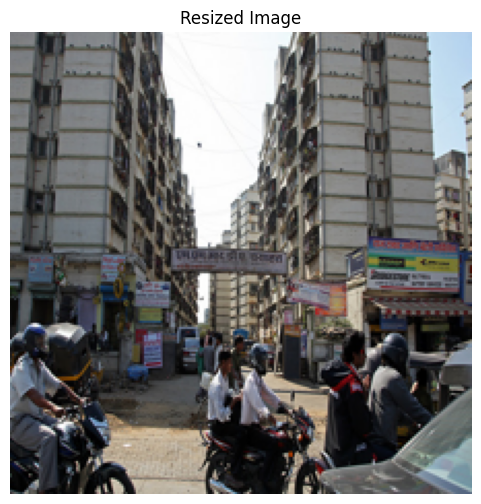

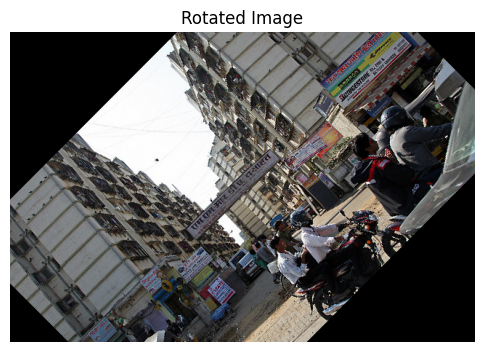

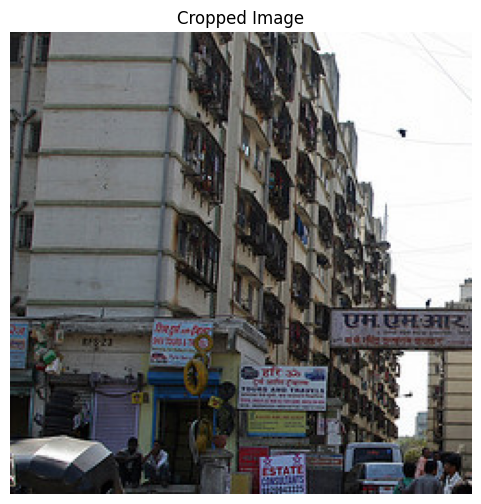

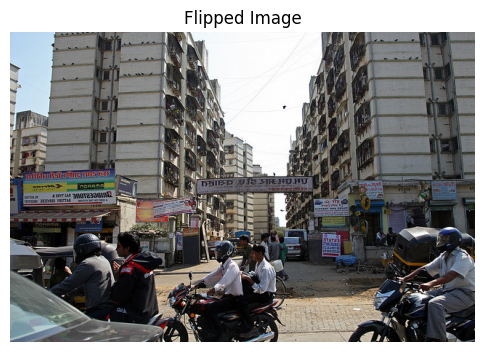

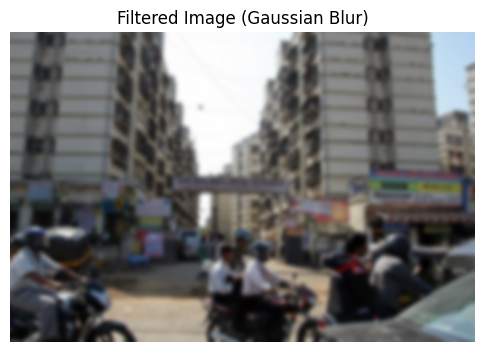

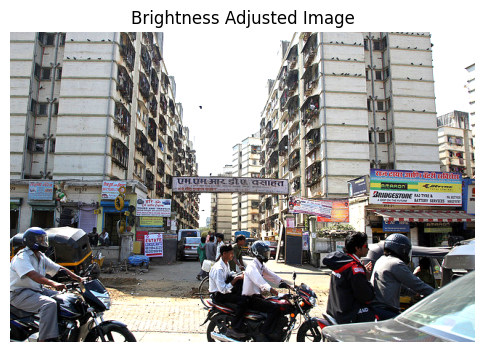

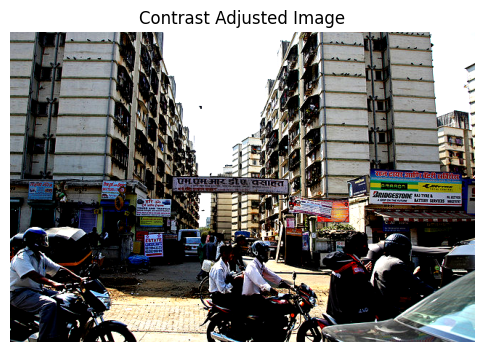

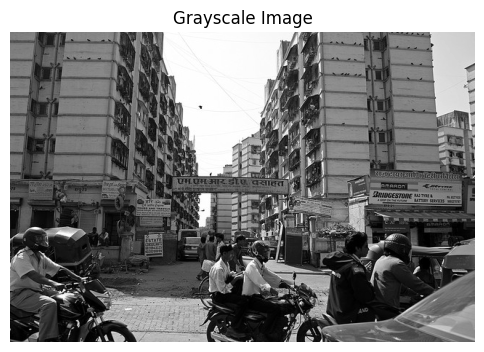

In [ ]:
# Manipulations
# 1. Resizing
resized_img = img.resize((224, 224))
show_image("Resized Image", resized_img)

# 2. Rotating
rotated_img = img.rotate(45)
show_image("Rotated Image", rotated_img)

# 3. Cropping
cropped_img = img.crop((50, 50, 300, 300))
show_image("Cropped Image", cropped_img)

# 4. Flipping
flipped_img = img.transpose(Image.FLIP_LEFT_RIGHT)
show_image("Flipped Image", flipped_img)

# 5. Applying Filters
filtered_img = img.filter(ImageFilter.GaussianBlur(3))
show_image("Filtered Image (Gaussian Blur)", filtered_img)

# 6. Adjusting Brightness and Contrast
bright_img = ImageEnhance.Brightness(img).enhance(1.5)
show_image("Brightness Adjusted Image", bright_img)

contrast_img = ImageEnhance.Contrast(img).enhance(2.0)
show_image("Contrast Adjusted Image", contrast_img)

# 7. Grayscale Conversion
grayscale_img = img.convert("L")
show_image("Grayscale Image", grayscale_img)

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


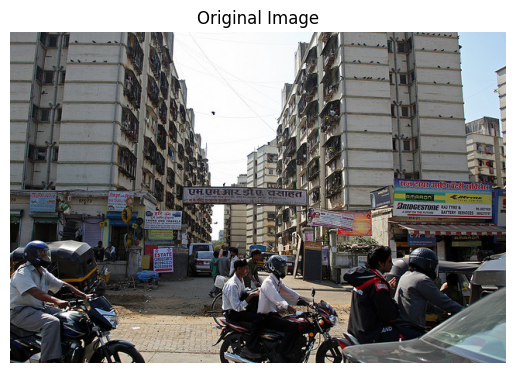

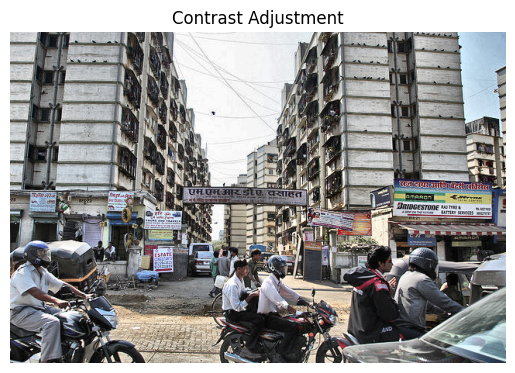

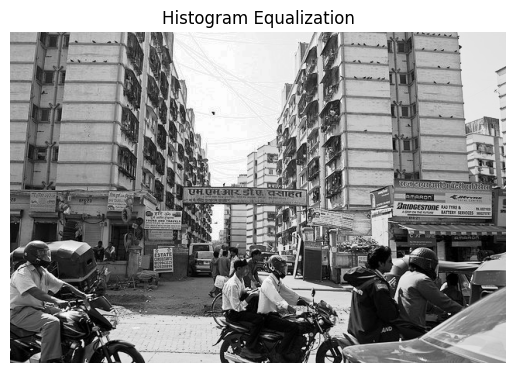

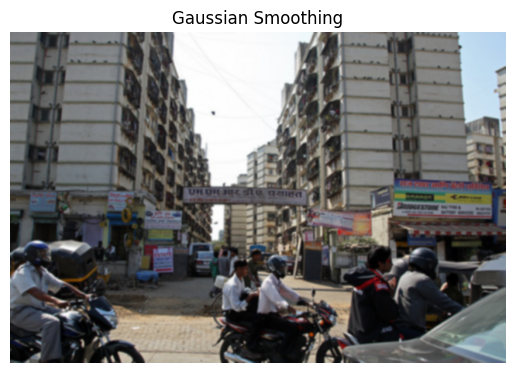

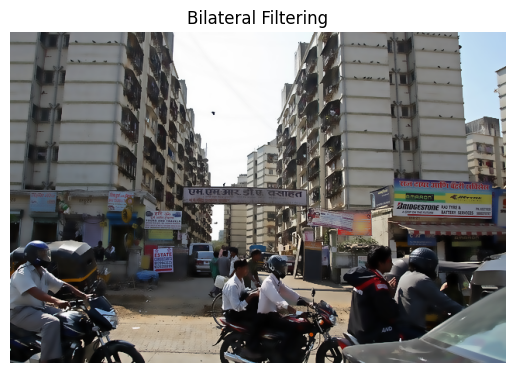

...

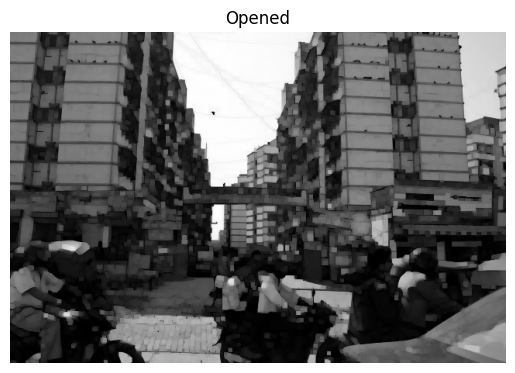

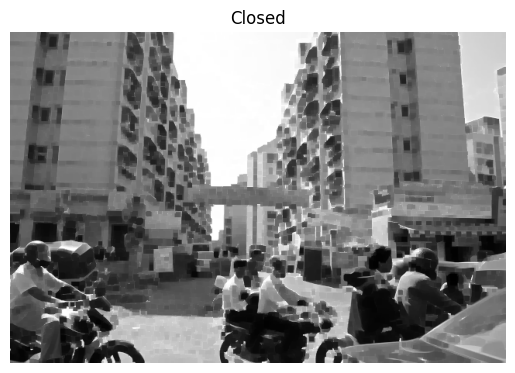

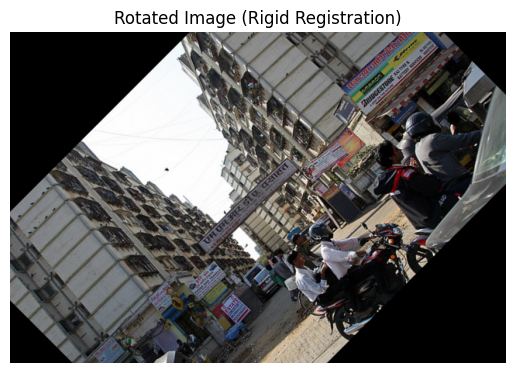

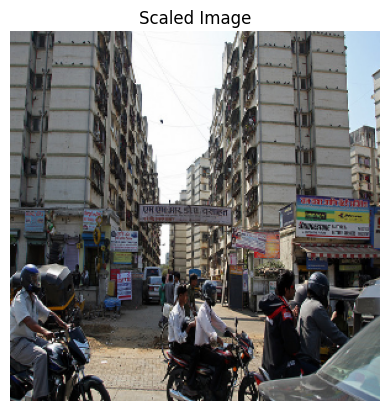

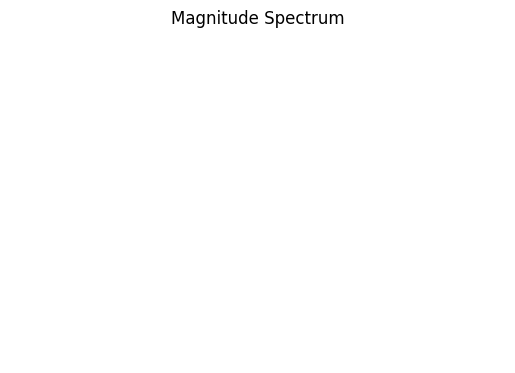

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import albumentations as A
from albumentations.core.transforms_interface import ImageOnlyTransform

# Helper function to display images
def show_image(title, image):
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# Load an image
image = cv2.imread(download_path)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Albumentations Augmentations
# 1. Image Enhancement Techniques
def apply_image_enhancements(image):
    # Contrast Adjustment
    contrast_adjust = A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8))(image=image)["image"]

    # Histogram Equalization
    equalized = cv2.equalizeHist(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))

    # Noise Reduction
    # Gaussian Smoothing
    gaussian_smoothed = cv2.GaussianBlur(image, (5, 5), 0)
    # Bilateral Filtering
    bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)

    # Display results
    show_image("Original Image", image)
    show_image("Contrast Adjustment", contrast_adjust)
    show_image("Histogram Equalization", cv2.cvtColor(equalized, cv2.COLOR_GRAY2BGR))
    show_image("Gaussian Smoothing", gaussian_smoothed)
    show_image("Bilateral Filtering", bilateral_filtered)

apply_image_enhancements(image)

# 2. Image Restoration Techniques
def apply_image_restoration(image):
    # Inpainting (masking part of the image)
    mask = np.zeros_like(gray_image)
    mask[50:150, 50:150] = 255  # Example mask
    inpainted = cv2.inpaint(image, mask, 3, cv2.INPAINT_TELEA)

    # Denoising using Non-Local Means
    denoised = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)

    # Display results
    show_image("Masked Image", mask)
    show_image("Inpainted Image", inpainted)
    show_image("Denoised Image", denoised)

apply_image_restoration(image)

# 3. Image Segmentation Techniques
def apply_image_segmentation(image):
    # Thresholding
    _, thresholded = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)

    # Edge Detection
    edges_canny = cv2.Canny(gray_image, 100, 200)

    # Sobel Edge Detection
    sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=5)

    # Display results
    show_image("Thresholding", cv2.cvtColor(thresholded, cv2.COLOR_GRAY2BGR))
    show_image("Canny Edge Detection", cv2.cvtColor(edges_canny, cv2.COLOR_GRAY2BGR))
    show_image("Sobel X", cv2.convertScaleAbs(sobelx))
    show_image("Sobel Y", cv2.convertScaleAbs(sobely))

apply_image_segmentation(image)

# 6. Feature Extraction Techniques
def apply_feature_extraction(image):
    # Color Detection (Red channel)
    red_channel = image[:, :, 2]

    # Display results
    show_image("Red Channel", cv2.merge([red_channel, red_channel, red_channel]))

apply_feature_extraction(image)

# 7. Morphological Processing Techniques
def apply_morphological_processing(image):
    kernel = np.ones((5, 5), np.uint8)

    # Dilation
    dilated = cv2.dilate(gray_image, kernel, iterations=1)

    # Erosion
    eroded = cv2.erode(gray_image, kernel, iterations=1)

    # Opening
    opened = cv2.morphologyEx(gray_image, cv2.MORPH_OPEN, kernel)

    # Closing
    closed = cv2.morphologyEx(gray_image, cv2.MORPH_CLOSE, kernel)

    # Display results
    show_image("Dilated", cv2.cvtColor(dilated, cv2.COLOR_GRAY2BGR))
    show_image("Eroded", cv2.cvtColor(eroded, cv2.COLOR_GRAY2BGR))
    show_image("Opened", cv2.cvtColor(opened, cv2.COLOR_GRAY2BGR))
    show_image("Closed", cv2.cvtColor(closed, cv2.COLOR_GRAY2BGR))

apply_morphological_processing(image)

# 8. Image Registration Techniques
def apply_image_registration(image):
    # Rotation (Rigid Registration)
    (h, w) = gray_image.shape[:2]
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, 45, 1.0)
    rotated = cv2.warpAffine(image, rotation_matrix, (w, h))

    # Display results
    show_image("Rotated Image (Rigid Registration)", rotated)

apply_image_registration(image)

# 9. Image Transformation Techniques
def apply_image_transformation(image):
    # Scaling
    scaled = cv2.resize(image, (300, 300))

    # Fourier Transform
    dft = cv2.dft(np.float32(gray_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    # Display results
    show_image("Scaled Image", scaled)
    show_image("Magnitude Spectrum", cv2.merge([magnitude_spectrum]*3))

apply_image_transformation(image)


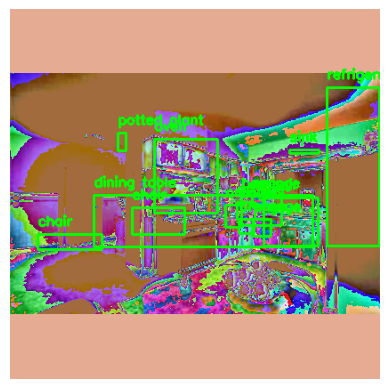

In [ ]:
import json
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from albumentations import (
    Resize, RandomBrightnessContrast, GaussianBlur, HorizontalFlip, Normalize, Compose, BboxParams
)
from albumentations.pytorch.transforms import ToTensorV2
import matplotlib.pyplot as plt
import urllib.request
from io import BytesIO
from PIL import Image

# Helper function to display images with bounding boxes
def visualize(image, bboxes, labels, category_mapping):
    for bbox, label in zip(bboxes, labels):
        x_min, y_min, x_max, y_max = map(int, bbox)
        image = cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        label_name = category_mapping[label]
        image = cv2.putText(image, label_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# COCO Dataset Class
class CocoDataset(Dataset):
    def __init__(self, images, annotations, category_mapping, transform=None, target_size=(416, 416)):
        self.images = images
        self.annotations = annotations
        self.category_mapping = category_mapping
        self.transform = transform
        self.target_size = target_size
        self.image_id_to_annotations = self._group_annotations_by_image()

    def _group_annotations_by_image(self):
        image_id_to_annotations = {}
        for ann in self.annotations:
            image_id = ann['image_id']
            if image_id not in image_id_to_annotations:
                image_id_to_annotations[image_id] = []
            image_id_to_annotations[image_id].append(ann)
        return image_id_to_annotations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_info = self.images[idx]
        img_url = image_info['coco_url']  # Use the coco_url provided in the dataset

        # Download image
        response = urllib.request.urlopen(img_url)
        img_data = BytesIO(response.read())
        image = np.array(Image.open(img_data))

        # Convert to RGB (if not already in RGB)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get annotations
        image_id = image_info['id']
        annotations = self.image_id_to_annotations.get(image_id, [])

        boxes = []
        labels = []
        for ann in annotations:
            x, y, width, height = ann['bbox']
            boxes.append([x, y, x + width, y + height])
            labels.append(ann['category_id'])

        # Convert boxes and labels to numpy arrays for Albumentations
        boxes = np.array(boxes, dtype=np.float32)
        labels = np.array(labels, dtype=np.int64)

        # Resize and pad the image dynamically while keeping the aspect ratio
        h, w, _ = image.shape
        target_h, target_w = self.target_size

        # Calculate the scaling factor and the padding
        scale = min(target_h / h, target_w / w)
        new_h, new_w = int(h * scale), int(w * scale)
        image_resized = cv2.resize(image, (new_w, new_h))

        # Create a padded image
        top = (target_h - new_h) // 2
        bottom = target_h - new_h - top
        left = (target_w - new_w) // 2
        right = target_w - new_w - left

        image_padded = cv2.copyMakeBorder(image_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=(0, 0, 0))

        # Update bounding boxes based on the scaling and padding
        scale_x = new_w / w
        scale_y = new_h / h
        boxes[:, [0, 2]] *= scale_x  # x-coordinates
        boxes[:, [1, 3]] *= scale_y  # y-coordinates

        # Apply transformations if any
        if self.transform:
            transformed = self.transform(image=image_padded, bboxes=boxes, labels=labels)
            image_padded = transformed['image']
            boxes = transformed['bboxes']
            labels = transformed['labels']

        # Convert to PyTorch tensors
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels}

        return image_padded, target

# Load COCO JSON file
with open('/content/instances_val2017.json', 'r') as f:
    coco_data = json.load(f)

# Extract data
images = coco_data['images'][:5]  # Only select the first five images
annotations = coco_data['annotations']
categories = coco_data['categories']

# Create category mapping
category_mapping = {cat['id']: cat['name'] for cat in categories}

# Define transformations
transform = Compose([
    RandomBrightnessContrast(p=0.2),
    GaussianBlur(p=0.2),
    HorizontalFlip(p=0.5),
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], bbox_params=BboxParams(format='pascal_voc', label_fields=['labels']))

# Dataset and DataLoader (Process five images)
dataset = CocoDataset(images, annotations, category_mapping, transform=transform, target_size=(416, 416))
data_loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Test the DataLoader for a single sample (only one image)
for images, targets in data_loader:
    # Process only the first image and target in the batch
    img = images[0]  # Get the first image from the batch
    target = targets[0]  # Get the corresponding target

    # Convert the image and target for visualization
    img = img.permute(1, 2, 0).numpy()  # Convert PyTorch tensor to NumPy array
    img = (img * 255).astype(np.uint8)  # Rescale pixel values for visualization

    # Visualize the image with bounding boxes
    visualize(img, target['boxes'].numpy(), target['labels'].numpy(), category_mapping)

    break  # Exit after processing one image


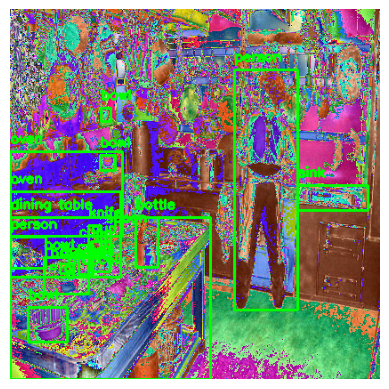

In [ ]:
import json
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from albumentations import (
    Resize, RandomBrightnessContrast, GaussianBlur, HorizontalFlip, Normalize, Compose, BboxParams
)
from albumentations.pytorch.transforms import ToTensorV2
import matplotlib.pyplot as plt
import urllib.request
from io import BytesIO
from PIL import Image

# Helper function to display images with bounding boxes
def visualize(image, bboxes, labels, category_mapping):
    for bbox, label in zip(bboxes, labels):
        x_min, y_min, x_max, y_max = map(int, bbox)
        image = cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        label_name = category_mapping[label]
        image = cv2.putText(image, label_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# COCO Dataset Class
class CocoDataset(Dataset):
    def __init__(self, images, annotations, category_mapping, transform=None):
        self.images = images
        self.annotations = annotations
        self.category_mapping = category_mapping
        self.transform = transform
        self.image_id_to_annotations = self._group_annotations_by_image()

    def _group_annotations_by_image(self):
        image_id_to_annotations = {}
        for ann in self.annotations:
            image_id = ann['image_id']
            if image_id not in image_id_to_annotations:
                image_id_to_annotations[image_id] = []
            image_id_to_annotations[image_id].append(ann)
        return image_id_to_annotations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_info = self.images[idx]
        img_url = image_info['coco_url']  # Use the coco_url provided in the dataset

        # Download image
        response = urllib.request.urlopen(img_url)
        img_data = BytesIO(response.read())
        image = np.array(Image.open(img_data))

        # Convert to RGB (if not already in RGB)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get annotations
        image_id = image_info['id']
        annotations = self.image_id_to_annotations.get(image_id, [])

        boxes = []
        labels = []
        for ann in annotations:
            x, y, width, height = ann['bbox']
            boxes.append([x, y, x + width, y + height])
            labels.append(ann['category_id'])

        # Convert boxes and labels to numpy arrays for Albumentations
        boxes = np.array(boxes, dtype=np.float32)
        labels = np.array(labels, dtype=np.int64)

        # Apply transformations
        if self.transform:
            transformed = self.transform(image=image, bboxes=boxes, labels=labels)
            image = transformed['image']
            boxes = transformed['bboxes']
            labels = transformed['labels']

        # Convert to PyTorch tensors
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels}

        return image, target

# Load COCO JSON file
with open('/content/instances_val2017.json', 'r') as f:
    coco_data = json.load(f)

# Extract data
images = coco_data['images'][:5]  # Only select the first five images
annotations = coco_data['annotations']
categories = coco_data['categories']

# Create category mapping
category_mapping = {cat['id']: cat['name'] for cat in categories}

# Define transformations
transform = Compose([
    Resize(416, 416),
    RandomBrightnessContrast(p=0.2),
    GaussianBlur(p=0.2),
    HorizontalFlip(p=0.5),
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], bbox_params=BboxParams(format='pascal_voc', label_fields=['labels']))

# Dataset and DataLoader (Process five images)
dataset = CocoDataset(images, annotations, category_mapping, transform=transform)
data_loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Test the DataLoader for a single sample (only one image)
for images, targets in data_loader:
    # Process only the first image and target in the batch
    img = images[0]  # Get the first image from the batch
    target = targets[0]  # Get the corresponding target

    # Convert the image and target for visualization
    img = img.permute(1, 2, 0).numpy()  # Convert PyTorch tensor to NumPy array
    img = (img * 255).astype(np.uint8)  # Rescale pixel values for visualization

    # Visualize the image with bounding boxes
    visualize(img, target['boxes'].numpy(), target['labels'].numpy(), category_mapping)

    break  # Exit after processing one image


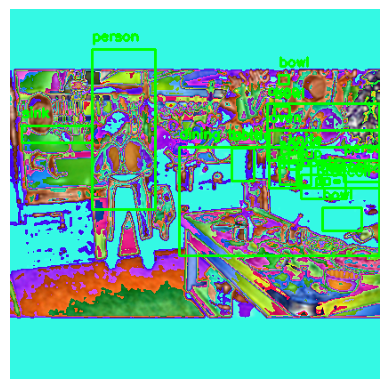

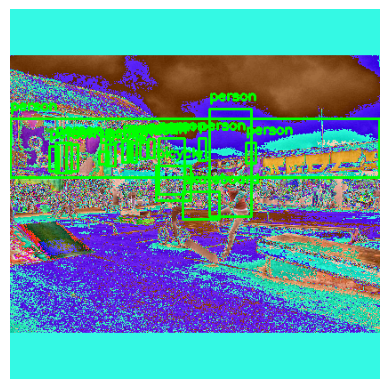

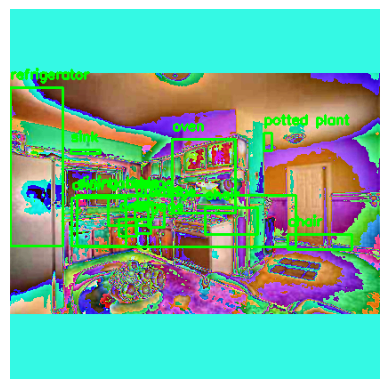

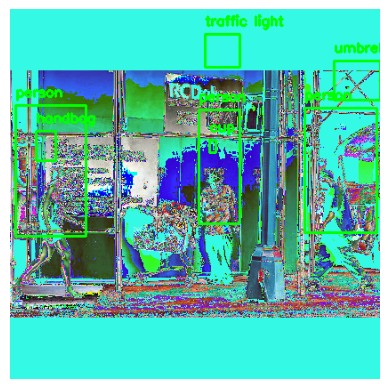

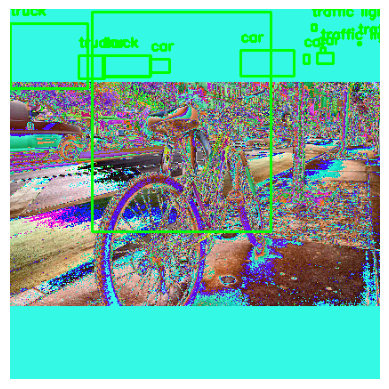

In [ ]:
import json
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from albumentations import (
    Resize, RandomBrightnessContrast, GaussianBlur, HorizontalFlip, Normalize, Compose, BboxParams
)
from albumentations.pytorch.transforms import ToTensorV2
import matplotlib.pyplot as plt
import urllib.request
from io import BytesIO
from PIL import Image

# Helper function to display images with bounding boxes
def visualize(image, bboxes, labels, category_mapping):
    for bbox, label in zip(bboxes, labels):
        x_min, y_min, x_max, y_max = map(int, bbox)
        image = cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        label_name = category_mapping[label]
        image = cv2.putText(image, label_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# COCO Dataset Class
class CocoDataset(Dataset):
    def __init__(self, images, annotations, category_mapping, transform=None, target_size=(416, 416)):
        self.images = images
        self.annotations = annotations
        self.category_mapping = category_mapping
        self.transform = transform
        self.target_size = target_size
        self.image_id_to_annotations = self._group_annotations_by_image()

    def _group_annotations_by_image(self):
        image_id_to_annotations = {}
        for ann in self.annotations:
            image_id = ann['image_id']
            if image_id not in image_id_to_annotations:
                image_id_to_annotations[image_id] = []
            image_id_to_annotations[image_id].append(ann)
        return image_id_to_annotations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_info = self.images[idx]
        img_url = image_info['coco_url']  # Use the coco_url provided in the dataset

        # Download image
        response = urllib.request.urlopen(img_url)
        img_data = BytesIO(response.read())
        image = np.array(Image.open(img_data))

        # Convert to RGB (if not already in RGB)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get annotations
        image_id = image_info['id']
        annotations = self.image_id_to_annotations.get(image_id, [])

        boxes = []
        labels = []
        for ann in annotations:
            x, y, width, height = ann['bbox']
            boxes.append([x, y, x + width, y + height])
            labels.append(ann['category_id'])

        # Convert boxes and labels to numpy arrays for Albumentations
        boxes = np.array(boxes, dtype=np.float32)
        labels = np.array(labels, dtype=np.int64)

        # Resize and pad the image dynamically while keeping the aspect ratio
        h, w, _ = image.shape
        target_h, target_w = self.target_size

        # Calculate the scaling factor and the padding
        scale = min(target_h / h, target_w / w)
        new_h, new_w = int(h * scale), int(w * scale)
        image_resized = cv2.resize(image, (new_w, new_h))

        # Create a padded image
        top = (target_h - new_h) // 2
        bottom = target_h - new_h - top
        left = (target_w - new_w) // 2
        right = target_w - new_w - left

        image_padded = cv2.copyMakeBorder(image_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=(0, 0, 0))

        # Update bounding boxes based on the scaling and padding
        scale_x = new_w / w
        scale_y = new_h / h
        boxes[:, [0, 2]] *= scale_x  # x-coordinates
        boxes[:, [1, 3]] *= scale_y  # y-coordinates

        # Apply transformations if any
        if self.transform:
            transformed = self.transform(image=image_padded, bboxes=boxes, labels=labels)
            image_padded = transformed['image']
            boxes = transformed['bboxes']
            labels = transformed['labels']

        # Convert to PyTorch tensors
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels}

        return image_padded, target

# Load COCO JSON file
with open('/content/instances_val2017.json', 'r') as f:
    coco_data = json.load(f)

# Extract data
images = coco_data['images'][:5]  # Only select the first five images
annotations = coco_data['annotations']
categories = coco_data['categories']

# Create category mapping
category_mapping = {cat['id']: cat['name'] for cat in categories}

# Define transformations
transform = Compose([
    RandomBrightnessContrast(p=0.2),
    GaussianBlur(p=0.2),
    HorizontalFlip(p=0.5),
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], bbox_params=BboxParams(format='pascal_voc', label_fields=['labels']))

# Dataset and DataLoader (Process five images)
dataset = CocoDataset(images, annotations, category_mapping, transform=transform, target_size=(416, 416))
data_loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Process and display first five images
for idx, (images, targets) in enumerate(data_loader):
    if idx >= 5:  # Stop after processing 5 images
        break

    # Process only the first image and target in the batch
    img = images[0]  # Get the first image from the batch
    target = targets[0]  # Get the corresponding target

    # Convert the image and target for visualization
    img = img.permute(1, 2, 0).numpy()  # Convert PyTorch tensor to NumPy array
    img = (img * 255).astype(np.uint8)  # Rescale pixel values for visualization

    # Visualize the image with bounding boxes
    visualize(img, target['boxes'].numpy(), target['labels'].numpy(), category_mapping)


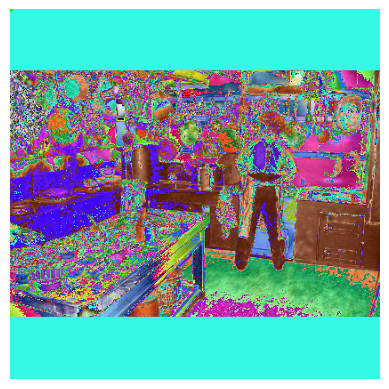

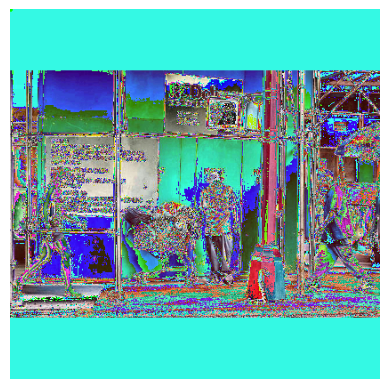

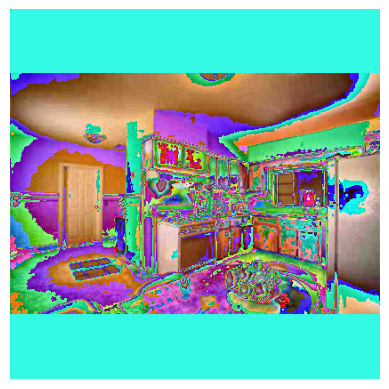

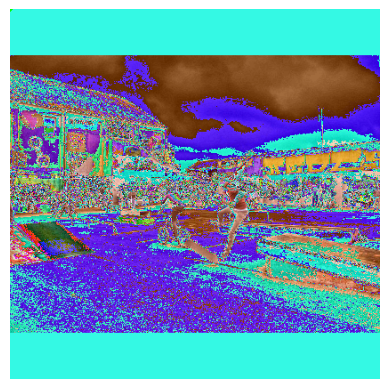

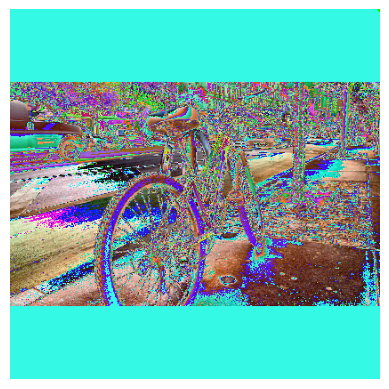

In [ ]:
import json
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from albumentations import (
    RandomBrightnessContrast, GaussianBlur, HorizontalFlip, Normalize, Compose, BboxParams
)
from albumentations.pytorch.transforms import ToTensorV2
import matplotlib.pyplot as plt
import urllib.request
from io import BytesIO
from PIL import Image

# Helper function to display images with bounding boxes
def visualize(image, bboxes, labels, category_mapping):
    for bbox, label in zip(bboxes, labels):
        x_min, y_min, x_max, y_max = map(int, bbox)
        image = cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        label_name = category_mapping[label]
        image = cv2.putText(image, label_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# COCO Dataset Class
class CocoDataset(Dataset):
    def __init__(self, images, annotations, category_mapping, transform=None, target_size=(416, 416)):
        self.images = images
        self.annotations = annotations
        self.category_mapping = category_mapping
        self.transform = transform
        self.target_size = target_size
        self.image_id_to_annotations = self._group_annotations_by_image()

    def _group_annotations_by_image(self):
        image_id_to_annotations = {}
        for ann in self.annotations:
            image_id = ann['image_id']
            if image_id not in image_id_to_annotations:
                image_id_to_annotations[image_id] = []
            image_id_to_annotations[image_id].append(ann)
        return image_id_to_annotations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_info = self.images[idx]
        img_url = image_info['coco_url']  # Use the coco_url provided in the dataset

        # Download image
        response = urllib.request.urlopen(img_url)
        img_data = BytesIO(response.read())
        image = np.array(Image.open(img_data))

        # Convert to RGB (if not already in RGB)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get annotations
        image_id = image_info['id']
        annotations = self.image_id_to_annotations.get(image_id, [])

        boxes = []
        labels = []
        for ann in annotations:
            x, y, width, height = ann['bbox']
            boxes.append([x, y, x + width, y + height])
            labels.append(ann['category_id'])

        # Convert boxes and labels to numpy arrays for Albumentations
        boxes = np.array(boxes, dtype=np.float32)
        labels = np.array(labels, dtype=np.int64)

        # Resize the image while maintaining aspect ratio
        h, w, _ = image.shape
        target_h, target_w = self.target_size

        # Calculate resizing scale to maintain aspect ratio
        scale = min(target_h / h, target_w / w)
        new_h, new_w = int(h * scale), int(w * scale)

        # Resize the image
        image_resized = cv2.resize(image, (new_w, new_h))

        # Calculate padding
        pad_height = target_h - new_h
        pad_width = target_w - new_w

        # Apply uniform padding (equal padding on all sides)
        top = pad_height // 2
        bottom = pad_height - top
        left = pad_width // 2
        right = pad_width - left

        # Create a padded image
        image_padded = cv2.copyMakeBorder(image_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=(0, 0, 0))

        # Update bounding boxes based on the padding (pixel values)
        boxes[:, [0, 2]] += left  # Update x-coordinates
        boxes[:, [1, 3]] += top  # Update y-coordinates

        # Normalize bounding boxes to [0, 1] range after resizing and padding
        boxes /= np.array([image_padded.shape[1], image_padded.shape[0], image_padded.shape[1], image_padded.shape[0]])

        # Apply transformations if any
        if self.transform:
            transformed = self.transform(image=image_padded, bboxes=boxes, labels=labels)
            image_padded = transformed['image']
            boxes = transformed['bboxes']
            labels = transformed['labels']

        # Convert to PyTorch tensors
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels}

        return image_padded, target

# Load COCO JSON file
with open('/content/instances_val2017.json', 'r') as f:
    coco_data = json.load(f)

# Extract data
images = coco_data['images'][:5]  # Only select the first five images
annotations = coco_data['annotations']
categories = coco_data['categories']

# Create category mapping
category_mapping = {cat['id']: cat['name'] for cat in categories}

# Define transformations
transform = Compose([
    RandomBrightnessContrast(p=0.2),
    GaussianBlur(p=0.2),
    HorizontalFlip(p=0.5),
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], bbox_params=BboxParams(format='pascal_voc', label_fields=['labels']))

# Dataset and DataLoader (Process five images)
dataset = CocoDataset(images, annotations, category_mapping, transform=transform, target_size=(416, 416))
data_loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Process and display first five images
for idx, (images, targets) in enumerate(data_loader):
    if idx >= 5:  # Stop after processing 5 images
        break

    # Process only the first image and target in the batch
    img = images[0]  # Get the first image from the batch
    target = targets[0]  # Get the corresponding target

    # Convert the image and target for visualization
    img = img.permute(1, 2, 0).numpy()  # Convert PyTorch tensor to NumPy array
    img = (img * 255).astype(np.uint8)  # Rescale pixel values for visualization

    # Visualize the image with bounding boxes
    visualize(img, target['boxes'].numpy(), target['labels'].numpy(), category_mapping)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:02<00:00, 76.4MB/s]


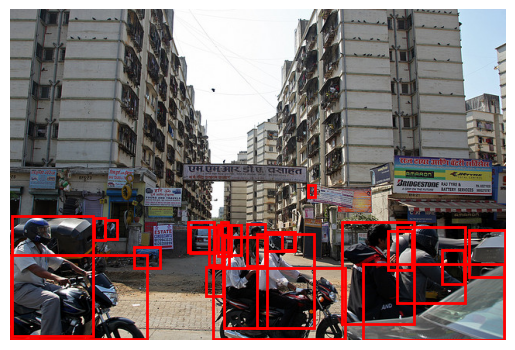

In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Load a pre-trained Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Load and preprocess an image
image_path = '/content/000000296649.jpg'
image = Image.open(image_path).convert("RGB")

# Define the transformations (resize, normalize, etc.)
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert image to tensor
])

# Apply the transformations to the image
image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

# Perform inference
with torch.no_grad():
    prediction = model(image_tensor)

# Extract boxes, labels, and scores
boxes = prediction[0]['boxes'].numpy()
labels = prediction[0]['labels'].numpy()
scores = prediction[0]['scores'].numpy()

# Filter out boxes with low confidence
threshold = 0.5
filtered_boxes = boxes[scores > threshold]
filtered_labels = labels[scores > threshold]
filtered_scores = scores[scores > threshold]

# Plot the image with bounding boxes
image_np = np.array(image)
plt.imshow(image_np)
for box in filtered_boxes:
    x1, y1, x2, y2 = box
    plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='red', linewidth=2))

plt.axis('off')
plt.show()
